<a href="https://colab.research.google.com/github/Exusai/SuperResolutionWaifuNN/blob/master/WaifuSuperResTutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [22]:
%tensorflow_version 2.x

In [23]:
from tensorflow import keras
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import clear_output

# Direcciones o paths
path = '/content/drive/MyDrive/DATA/AnimeSuperRes'
inputPath = path + '/AnimeGurPicsAtHalf'
targetPath = path + '/AnimeGurPics'
outputPath = path + '/output'

imgURLS = !ls -1 '{inputPath}'

n = len(imgURLS)
trainN = round(n * .80)

randomURLS = np.copy(imgURLS)
np.random.seed(22)
np.random.shuffle(randomURLS)

trainURLS = randomURLS[: trainN]
testURLS = randomURLS[trainN : n]

print('imágenes: ', n)
print('tr: ', len(trainURLS))
print('test: ', len(testURLS))

imágenes:  1450
tr:  1160
test:  290


In [ ]:
def normalize(inImage, targetImage):
  inImg = (inImage/127.5) - 1
  tarImg = (targetImage/127.5) - 1
  return inImg, tarImg

def loadImage(filename):
  inImg = tf.cast(tf.image.decode_jpeg(tf.io.read_file(inputPath + '/' + filename)), tf.float32)[...,:3]
  tarImg = tf.cast(tf.image.decode_jpeg(tf.io.read_file(targetPath + '/' + filename)), tf.float32)[...,:3]
  inImg, tarImg = normalize(inImg, tarImg)
  return inImg, tarImg

plt.figure(figsize = (20,20))
plt.subplot(1,2,1)
plt.title('Img en baja resolución')
plt.imshow((loadImage('178.jpg')[0] + 1)/2)
plt.axis('off')
plt.subplot(1,2,2)
plt.title('Img original')
plt.imshow((loadImage('178.jpg')[1] + 1)/2)
plt.axis('off')
plt.show()

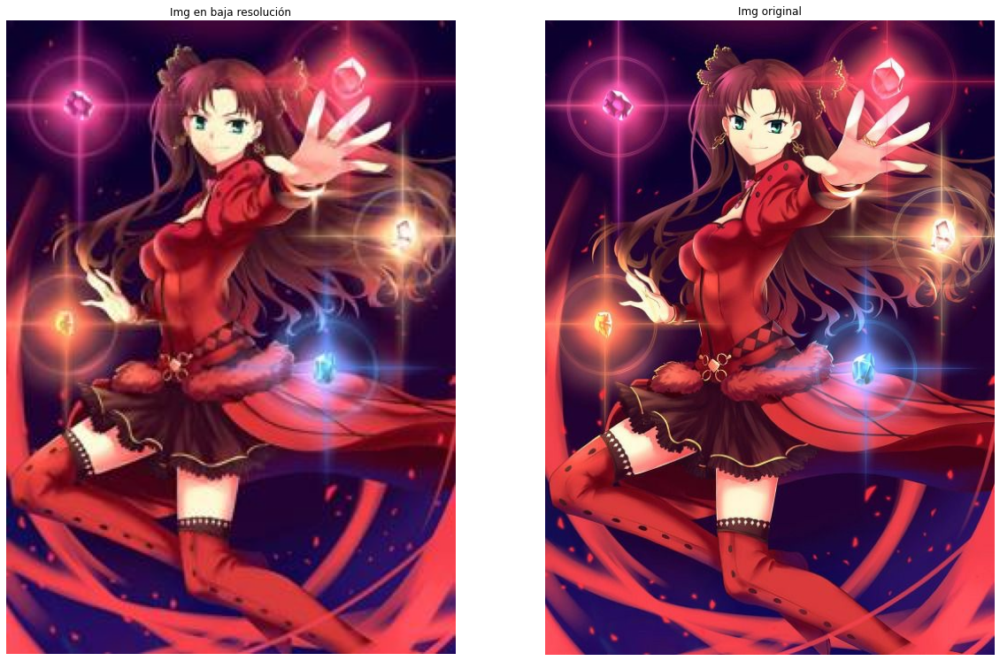

In [4]:
trainDataSet = tf.data.Dataset.from_tensor_slices(trainURLS[0:10])
trainDataSet = trainDataSet.map(loadImage, num_parallel_calls = tf.data.experimental.AUTOTUNE)
trainDataSet = trainDataSet.batch(1) # quizás sea necesario reducir el batch para no tener problemas de alocación de tensores

testDataSet = tf.data.Dataset.from_tensor_slices(testURLS[0:10])
testDataSet = testDataSet.map(loadImage, num_parallel_calls = tf.data.experimental.AUTOTUNE)
testDataSet = testDataSet.batch(1) # quizás sea necesario reducir el batch para no tener problemas de alocación de tensores

for inImg, tgImg in testDataSet.take(1):
  pass

plt.figure(figsize = (20,20))
plt.subplot(1,2,1)
plt.title('Img en baja resolución')
plt.imshow(((inImg[0,...]) + 1)/2)
plt.axis('off')
plt.subplot(1,2,2)
plt.title('Img original')
plt.imshow((tgImg[0,...] + 1)/2)
plt.axis('off')
plt.show()

In [5]:
initializer = tf.random_normal_initializer(0, 0.04)
generator = keras.models.Sequential()

generator.add(keras.layers.Input(shape = [None, None, 3], name = 'input'))

generator.add(keras.layers.Conv2D(16, (3,3), padding = 'SAME', kernel_initializer = initializer))
generator.add(keras.layers.Dropout(0.3))
generator.add(keras.layers.LeakyReLU())

generator.add(keras.layers.Conv2D(16, (3,3), padding = 'SAME', kernel_initializer = initializer))
generator.add(keras.layers.Dropout(0.3))
generator.add(keras.layers.LeakyReLU())

generator.add(keras.layers.Conv2D(32, (3,3), padding = 'SAME', kernel_initializer = initializer))
generator.add(keras.layers.Dropout(0.3))
generator.add(keras.layers.LeakyReLU())

generator.add(keras.layers.Conv2D(32, (3,3), padding = 'SAME', kernel_initializer = initializer))
generator.add(keras.layers.Dropout(0.3))
generator.add(keras.layers.LeakyReLU())

generator.add(keras.layers.Conv2D(64, (3,3), padding = 'SAME', kernel_initializer = initializer))
generator.add(keras.layers.Dropout(0.3))
generator.add(keras.layers.LeakyReLU())

generator.add(keras.layers.Conv2D(64, (3,3), padding = 'SAME', kernel_initializer = initializer))
generator.add(keras.layers.Dropout(0.3))
generator.add(keras.layers.LeakyReLU())

generator.add(keras.layers.Conv2D(128, (3,3), padding = 'SAME', kernel_initializer = initializer))
generator.add(keras.layers.Dropout(0.3))
generator.add(keras.layers.LeakyReLU())

generator.add(keras.layers.Conv2D(256, (3,3), padding = 'SAME', kernel_initializer = initializer))
generator.add(keras.layers.Dropout(0.3))
generator.add(keras.layers.LeakyReLU())

generator.add(keras.layers.Conv2DTranspose(3, (3,3), strides = 2, padding = 'SAME', activation = "tanh", kernel_initializer = initializer))

print(generator.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, None, None, 16)    448       
_________________________________________________________________
dropout (Dropout)            (None, None, None, 16)    0         
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, None, None, 16)    0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, None, None, 16)    2320      
_________________________________________________________________
dropout_1 (Dropout)          (None, None, None, 16)    0         
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, None, None, 16)    0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, None, None, 32)    4

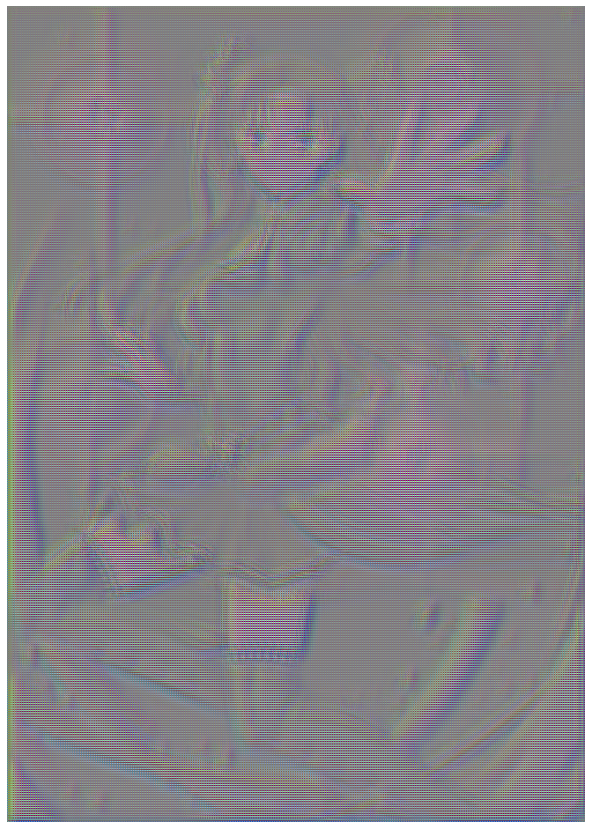

Dimensiones de entrada:  (1, 353, 250, 3)
Dimensiones de salida:  (1, 706, 500, 3)


In [18]:
genOutput = generator((inImg + 1)*255, training = False)
plt.figure(figsize = (15,15))
plt.imshow((genOutput[0,...]+1)/2)
plt.axis('off')
plt.show()

print('Dimensiones de entrada: ', inImg.shape)
print('Dimensiones de salida: ', genOutput.shape)

In [28]:
def resize(inimg, tgimg, HEIGHT, WIDTH):
  inimg = tf.image.resize(inimg, [HEIGHT, WIDTH])
  tgimg = tf.image.resize(tgimg, [HEIGHT, WIDTH])
  return inimg, tgimg

def generatorLoss(genOutput, target):
  genOutput, target = resize(genOutput, target, 800, 800)
  l1Loss = tf.reduce_mean(tf.abs(target - genOutput))
  totalGenLoss = l1Loss
  return totalGenLoss

generatorOptimizer = tf.keras.optimizers.Adam(2e-4, beta_1 = 0.5)
@tf.function()
def trainStep(inputImage, target):
  with tf.GradientTape() as genTape:
    outputImage = generator(inputImage, training = True)
    genLoss = generatorLoss(outputImage, target)
    generatorGrads = genTape.gradient(genLoss, generator.trainable_variables)
    generatorOptimizer.apply_gradients(zip(generatorGrads, generator.trainable_variables))

def train(dataset, epochs, testImages):
  for epoch in range(epochs + 1):
    imgi = 0
    for inputImage, target in dataset:
      print('epoch ' + str(epoch) + ' - train ' + str(imgi + 1) + '/' + str(len(dataset)))
      imgi += 1
      trainStep(inputImage, target)
      clear_output(wait = True)
    
    if epoch % 5 == 0:
      kerasFile = "modelo.h5"
      modelPath = outputPath + '/models/' + kerasFile
      keras.models.save_model(generator, modelPath)

      for inp, tar in testImages.take(4):
          generateImages(generator, inp, tar, str(imgi) + '_' + str(epoch), displayImages = True)
          imgi += 1

In [30]:
def generateImages(model, testInput, tar, saveFilename = False, displayImages = True):
  prediction = model(testInput, training = False)
  
  if saveFilename:
    tf.keras.preprocessing.image.save_img(outputPath + '/timelapse/' + saveFilename + '.jpg', prediction[0, ...])
  
  plt.figure(figsize = (15,15))
  displayList = [testInput[0], tar[0], prediction[0]]
  title = ["Entrada", "Objetivo", "2x img (predición)"]

  if displayImages:
    for i in range(3):
      plt.subplot(1, 3, i+1)
      plt.title(title[i])
      plt.imshow(displayList[i] * 0.5 + 0.5)
      plt.axis('off')
  plt.show()


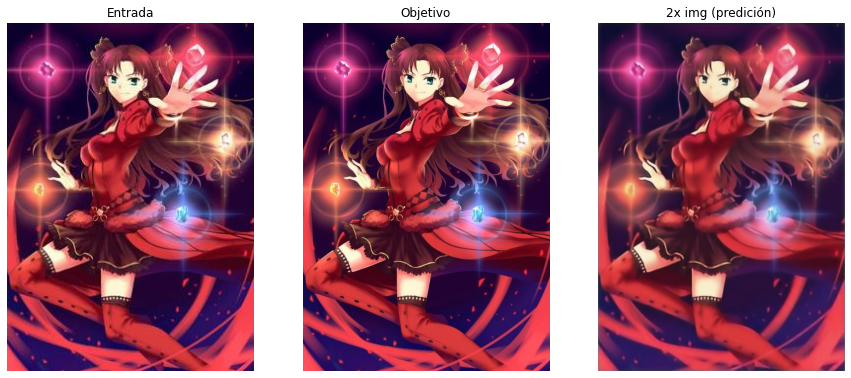

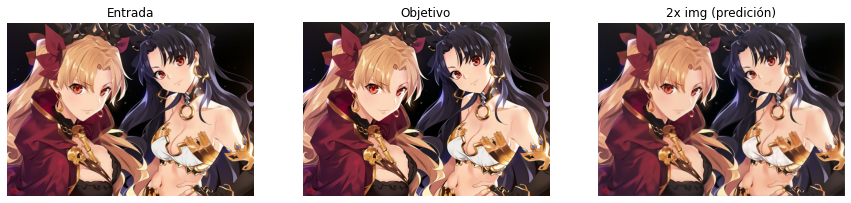

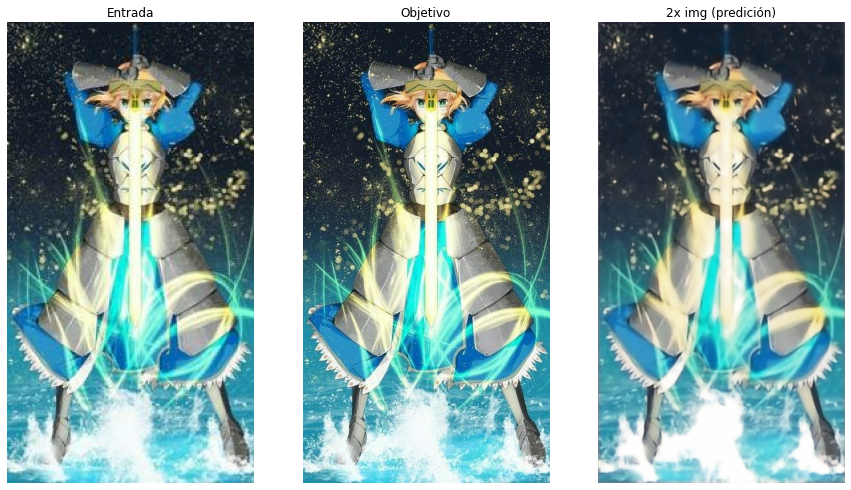

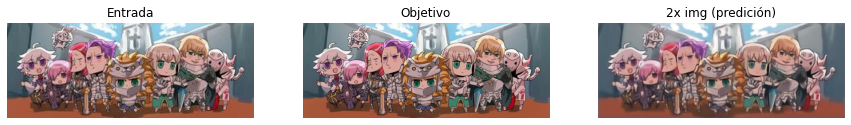

In [33]:
train(trainDataSet, 1000, testDataSet)  

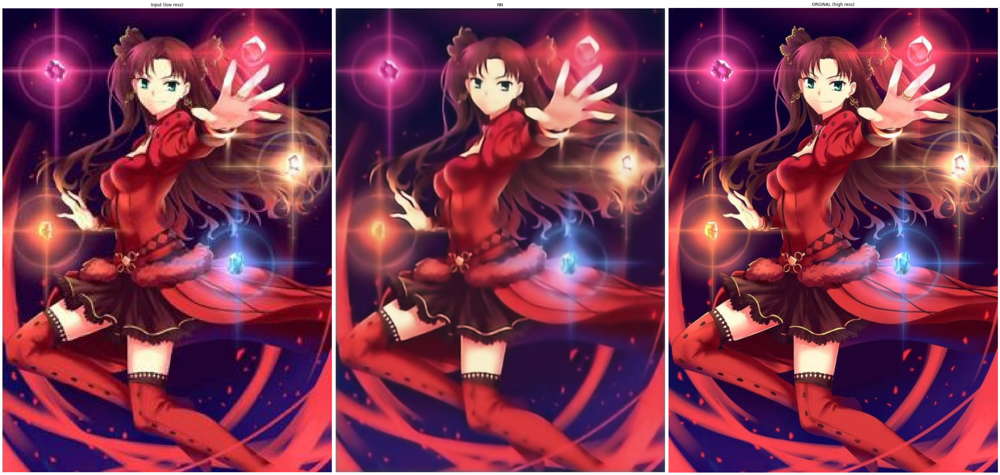

Tamaño de entrada: (1, 353, 250, 3)   Tamaño de salida: (1, 706, 500, 3)    Original: (1, 707, 500, 3)


In [34]:
for inimg, tgimg in testDataSet.take(1):
  pass  

genOutput = generator(inimg, training =  False) # after TR test

fig, axs = plt.subplots(1, 3, figsize=(40,40))
axs[0].imshow(((inimg[0, ...]) + 1)/ 2)
axs[0].set_title('Input (low ress)')
axs[0].axis('off')
axs[1].imshow((genOutput[0,...]+1)/2)
axs[1].set_title('NN')
axs[1].axis('off')
axs[2].imshow(((tgimg[0, ...]) + 1)/ 2)
axs[2].set_title('ORGINAL (high ress)')
axs[2].axis('off')

plt.tight_layout()
#Save to image
#fig.savefig((modelsPath + 'test.png'))
plt.show()

print('Tamaño de entrada:', inimg.shape, ' ', 'Tamaño de salida:',genOutput.shape, '  ', 'Original:', tgimg.shape)

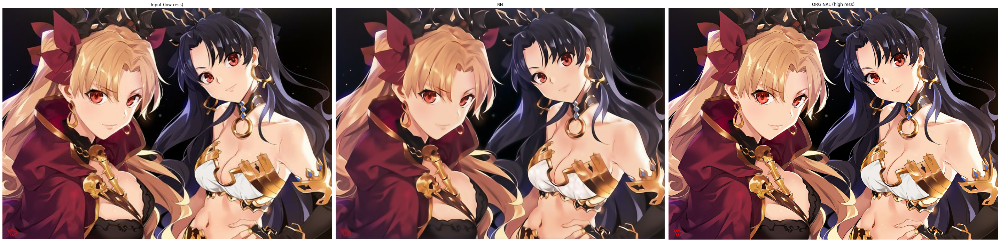

Tamaño de entrada: (1, 422, 600, 3)   Tamaño de salida: (1, 844, 1200, 3)    Original: (1, 845, 1200, 3)


In [35]:
for inimg, tgimg in testDataSet.take(2):
  pass  

genOutput = generator(inimg, training =  False) # after TR test

fig, axs = plt.subplots(1, 3, figsize=(40,40))
axs[0].imshow(((inimg[0, ...]) + 1)/ 2)
axs[0].set_title('Input (low ress)')
axs[0].axis('off')
axs[1].imshow((genOutput[0,...]+1)/2)
axs[1].set_title('NN')
axs[1].axis('off')
axs[2].imshow(((tgimg[0, ...]) + 1)/ 2)
axs[2].set_title('ORGINAL (high ress)')
axs[2].axis('off')

plt.tight_layout()
#Save to image
#fig.savefig((modelsPath + 'test.png'))
plt.show()

print('Tamaño de entrada:', inimg.shape, ' ', 'Tamaño de salida:',genOutput.shape, '  ', 'Original:', tgimg.shape)

# Extras
Pedazos de código extra 

In [ ]:
input, tar = resize(genOutput, tgImg, 800,800)
loss = tf.abs(tar - input)
#loss = (tar - input)*(tar - input)
#loss = (tar - input)

fig, axs = plt.subplots(1, 3, figsize=(20,20))
axs[0].imshow(((tar[0, ...]) + 1)/ 2)
axs[0].set_title('Objetivo')
axs[0].axis('off')
axs[1].imshow((input[0,...]+1)/2)
axs[1].set_title('Generada')
axs[1].axis('off')
axs[2].imshow(((loss[0, ...]) + 1)/ 2)
axs[2].set_title('Error')
axs[2].axis('off')

plt.tight_layout()
#Save to image
#fig.savefig((modelsPath + 'test.png'))
plt.show()

#print('Tamaño de entrada:', inimg.shape, ' ', 'Tamaño de salida:',genOutput.shape, '  ', 'Original:', tgimg.shape)
print(tf.reduce_mean(loss))

In [ ]:
#plt.imshow(((tar[0, ...]) + 1)/ 2)
#plt.imshow(((input[0, ...]) + 1)/ 2)
plt.imshow(((loss[0, ...]) + 1)/ 2)
plt.axis('off')
plt.tight_layout()
plt.savefig((outputPath + '/rinLoss.png'), dpi = 150, transparent = True , edgecolor = None)
plt.show()